In [1]:
import pandas as pd
import numpy as np

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
import os

In [10]:
os.listdir()

['03-Decision Trees and Random Forest Project - Solutions.ipynb',
 '02-Decision Trees and Random Forest Project.ipynb',
 '01-Decision Trees and Random Forests in Python.ipynb',
 'Basics Decision Tree & Random Forest.ipynb',
 '.ipynb_checkpoints',
 'loan_data.csv',
 'kyphosis.csv']

In [7]:
df = pd.read_csv('kyphosis.csv')

In [14]:
df.head()
##data has basic details about patient & column that categorise
##whether after operation Kyphosis is present or Absent

,Kyphosis,Age,Number,Start
0,absent,71,3,5
1,absent,158,3,14
2,present,128,4,5
3,absent,2,5,1
4,absent,1,4,15


In [16]:
df.isna().any() ##No null values

Kyphosis    False
Age         False
Number      False
Start       False
dtype: bool

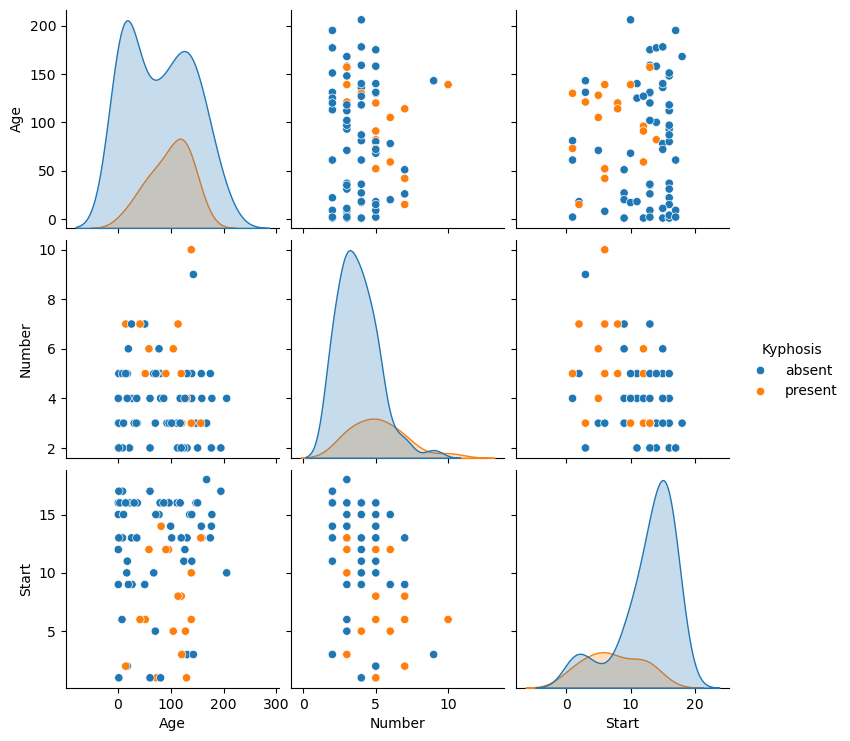

In [20]:
sns.pairplot(df, hue = 'Kyphosis') ## Start point of surgery differentiating the issue present
##Number of age or more or less same

<Axes: ylabel='Age'>

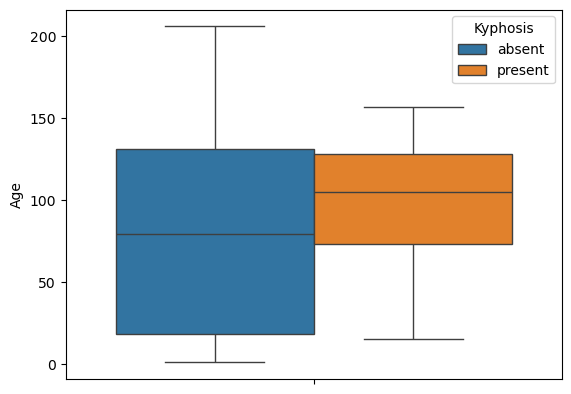

In [50]:
sns.boxplot(df, y= 'Age', hue= df['Kyphosis']) ##Median age for present is higher than absent

<Axes: ylabel='Start'>

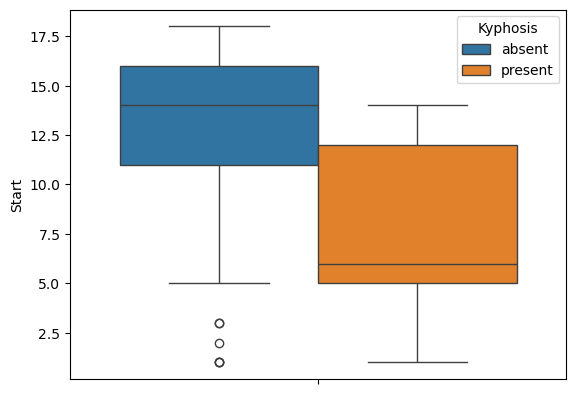

In [56]:
sns.boxplot(df, y= 'Start', hue= df['Kyphosis']) 
##Contrasting difeference can be seen

<Axes: ylabel='Number'>

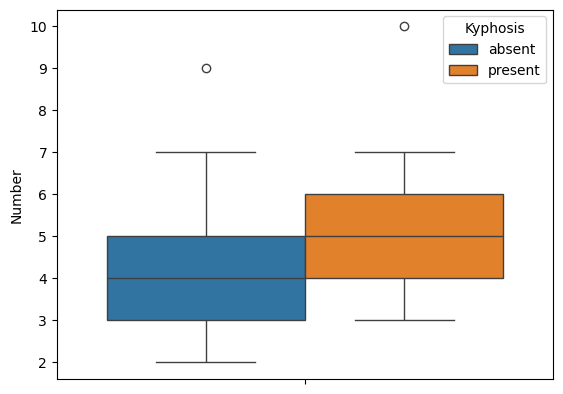

In [58]:
sns.boxplot(df, y= 'Number', hue= df['Kyphosis']) 
##Median number is higher for prsent than absent

In [62]:
##Correlation with dichotomos variable can be calculate to get the idea
from scipy.stats import pointbiserialr

In [9]:
df['Kyphosis_num'] = df['Kyphosis'].apply(func = lambda x: 1 if x == "present" else 0)
df.head()

,Kyphosis,Age,Number,Start,Kyphosis_num
0,absent,71,3,5,0
1,absent,158,3,14,0
2,present,128,4,5,1
3,absent,2,5,1,0
4,absent,1,4,15,0


In [72]:
for col in df.columns:
    if col in ['Age', 'Number', 'Start']:
        r, p = pointbiserialr(df[col], df['Kyphosis_num'])
        print(f"{col}: correlation = {r:.4f}, p-value = {p:.4f}")

Age: correlation = 0.1265, p-value = 0.2606
Number: correlation = 0.3609, p-value = 0.0009
Start: correlation = -0.4459, p-value = 0.0000


In [79]:
##Some noise correlation little less sig in Case of Age
## Number has more value in case of 1 that is present (which can seen by boxplot as well)
## Start less value in case of 1 that is present (which is evident in boxplot) as well

# Modeling

In [11]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OneHotEncoder

In [11]:
df.head()

,Kyphosis,Age,Number,Start
0,absent,71,3,5
1,absent,158,3,14
2,present,128,4,5
3,absent,2,5,1
4,absent,1,4,15


In [15]:
X = df.loc[:, ~df.columns.isin(['Kyphosis_num','Kyphosis'])]
Y = df.loc[:, df.columns.isin(['Kyphosis_num'])]

In [15]:
X.head()

,Age,Number,Start
0,71,3,5
1,158,3,14
2,128,4,5
3,2,5,1
4,1,4,15


In [17]:
Y.head()

""
0
1
2
3
4


In [17]:
X_train, X_test, y_train, y_test = train_test_split( X, Y, test_size=0.3, random_state=42)
X_cal, X_test, y_val, y_test = train_test_split( X_test, y_test, test_size=0.5, random_state=42)

In [53]:
##Scaling
Scaling = StandardScaler()
Scaled_X = pd.DataFrame(Scaling.fit_transform(X_train), columns= X_train.columns)
Scaled_X.head()

,Age,Number,Start
0,0.011686,-0.041030,-2.004957
1,1.079439,2.831104,-1.612378
2,1.027773,-0.041030,0.743096
3,-0.039979,1.107823,0.743096
4,0.183904,0.533396,0.154227


In [ ]:
# Using Logistic Regression

In [31]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [1073]:
para = {'penalty':[None,'l1','l2','elasticnet'],
       'C': [1,1.5,0.5,10,5,0.01, 100, 1000] , 
       #  'fit_intercept': [True, False],
       'solver': [ 'saga', 'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
       #  'max_iter': [1000, 10000],
       'l1_ratio': [0,0.25,0.55,0.75,0.9,1]
       #'class_weight' : ['balanced'] #, None, {0:1, 1:6}
       }     

In [1075]:
##FN has more cost that is why using recall
##But recall geneerating more misclassification, so using better f1
model = GridSearchCV(estimator= LogisticRegression(random_state= 42), param_grid= para, cv = 5, scoring= "precision")

In [1079]:
model.best_params_ ##l1 -> 0 pure L2

{'C': 1, 'l1_ratio': 0, 'penalty': 'l2', 'solver': 'liblinear'}

In [1081]:
model.best_score_ ##l1- ration will

0.6333333333333333

In [307]:
df['Kyphosis_num'].value_counts()

Kyphosis_num
0    64
1    17
Name: count, dtype: int64

In [281]:
df['Kyphosis'].value_counts()/df['Kyphosis'].value_counts().sum()

Kyphosis
absent     0.790123
present    0.209877
Name: count, dtype: float64

In [285]:
df['Kyphosis'].value_counts()[1]/df['Kyphosis'].value_counts()[0] ##Mildly Balanced

/var/folders/l3/f7hpz30s08nbzkwqz28bhvnr0000gn/T/ipykernel_32542/843687772.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  df['Kyphosis'].value_counts()[1]/df['Kyphosis'].value_counts()[0]
/var/folders/l3/f7hpz30s08nbzkwqz28bhvnr0000gn/T/ipykernel_32542/843687772.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  df['Kyphosis'].value_counts()[1]/df['Kyphosis'].value_counts()[0]


0.265625

In [743]:
model = GridSearchCV(estimator= LogisticRegression(), param_grid= para, cv = 5, scoring= "f1")
model.fit(Scaled_X,y_train.values.ravel() )

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [1, 1.5, 0.5, 10, 5, 0.01],
                         'class_weight': [None, 'balanced'],
                         'fit_intercept': [True, False],
                         'l1_ratio': [0, 0.25, 0.55, 0.75, 0.9, 1],
                         'max_iter': [1000, 10000], 'penalty': ['elasticnet'],
                         'solver': ['saga']},
             scoring='f1')

In [465]:
model.best_params_ 

{'C': 0.01,
 'class_weight': {0: 1, 1: 2},
 'fit_intercept': True,
 'max_iter': 1000,
 'penalty': 'l2',
 'solver': 'liblinear'}

In [479]:
model.best_score_

0.6676190476190476

In [1083]:
y_pred_train = model.predict(Scaled_X)

In [1085]:
print("**** Train  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_train,y_pred_train) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_train,y_pred_train)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_train,y_pred_train)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_train,y_pred_train)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_train,y_pred_train)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_train,y_pred_train)*100,1), "%")

**** Train  Data Metrics ****
Accuracy Score 83.929 %
F1 Score 52.6 %
Precision Score 62.5 %
Recall Score 45.5 %
Misclasification %  16.071 %


In [1087]:
##Validation score
Scaled_X_val = pd.DataFrame(Scaling.transform(X_cal), columns= X_cal.columns)

y_pred_val = model.predict(Scaled_X_val)

print("**** Validation  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_val,y_pred_val) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_val,y_pred_val)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_val,y_pred_val)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_val,y_pred_val)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_val,y_pred_val)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Validation  Data Metrics ****
Accuracy Score 83.333 %
F1 Score 66.7 %
Precision Score 100.0 %
Recall Score 50.0 %
Misclasification %  16.667 %


In [1089]:
##Validation score
Scaled_X_test = pd.DataFrame(Scaling.transform(X_test), columns= X_cal.columns)

y_pred_test = model.predict(Scaled_X_test)

print("**** Test  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_test,y_pred_test) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_test,y_pred_test)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_test,y_pred_test)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_test,y_pred_test)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_test,y_pred_test)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_test,y_pred_test)*100,1), "%")

**** Test  Data Metrics ****
Accuracy Score 84.615 %
F1 Score 0.0 %
Precision Score 0.0 %
Recall Score 0.0 %
Misclasification %  15.385 %


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# KNN

In [1125]:
np.sqrt(X_train.shape[0])

7.483314773547883

In [1127]:
X_train.shape[0]

56

In [25]:
from sklearn.neighbors import KNeighborsClassifier

In [1185]:
para_knn = {'n_neighbors' : (range(3,32,2)),
            'weights': ['uniform', 'distance'],
            'algorithm': ['auto'],
            'metric': ['minkowski'],
            'p':range(1,10,1),
            'n_jobs':[-1]
           
           }

In [1201]:
model_knn = GridSearchCV(estimator= KNeighborsClassifier(),param_grid= para_knn, cv = 5, scoring= "recall")

In [1205]:
model_knn.fit(Scaled_X,y_train.values.ravel())

/opt/anaconda3/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto'], 'metric': ['minkowski'],
                         'n_jobs': [-1], 'n_neighbors': range(3, 32, 2),
                         'p': range(1, 50),
                         'weights': ['uniform', 'distance']},
             scoring='recall')

In [1206]:
model_knn.best_params_

{'algorithm': 'auto',
 'metric': 'minkowski',
 'n_jobs': -1,
 'n_neighbors': 5,
 'p': 1,
 'weights': 'uniform'}

In [1207]:
model_knn.best_score_

0.7666666666666666

In [1211]:
y_pred_train_knn = model_knn.predict(Scaled_X)

print("**** Train  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_train,y_pred_train_knn) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_train,y_pred_train_knn)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_train,y_pred_train_knn)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_train,y_pred_train_knn)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_train,y_pred_train_knn)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_train,y_pred_train)*100,1), "%")

**** Train  Data Metrics ****
Accuracy Score 87.5 %
F1 Score 69.6 %
Precision Score 66.7 %
Recall Score 72.7 %
Misclasification %  12.5 %


In [1213]:
##Validation score
y_pred_val_knn = model_knn.predict(Scaled_X_val)

print("**** Validation  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_val,y_pred_val_knn) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_val,y_pred_val_knn)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_val,y_pred_val_knn)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_val,y_pred_val_knn)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_val,y_pred_val_knn)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Validation  Data Metrics ****
Accuracy Score 75.0 %
F1 Score 40.0 %
Precision Score 100.0 %
Recall Score 25.0 %
Misclasification %  25.0 %


In [1215]:
y_pred_test_knn = model_knn.predict(Scaled_X_test)

print("**** Test  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_test,y_pred_test_knn) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_test,y_pred_test_knn)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_test,y_pred_test_knn)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_test,y_pred_test_knn)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_test,y_pred_test_knn)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_test,y_pred_test)*100,1), "%")

**** Test  Data Metrics ****
Accuracy Score 84.615 %
F1 Score 0.0 %
Precision Score 0.0 %
Recall Score 0.0 %
Misclasification %  15.385 %


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Decision Tree

In [27]:
from sklearn.tree import DecisionTreeClassifier

In [29]:
model_t = DecisionTreeClassifier()

In [1227]:
model_t.fit(Scaled_X, y_train)

DecisionTreeClassifier()

In [264]:
param_decision_t = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    # 'max_depth': range(3,10),
    # 'min_samples_split': range(2,10),
    # 'min_samples_leaf': range(2,10),
    'random_state': [42],
    'max_leaf_nodes' : range(5,10)
    # ,'min_impurity_decrease' : [0.001,.0001,.005,.05,.3,5,1,10]
    
}

In [266]:
model_t = GridSearchCV(DecisionTreeClassifier(),param_decision_t, scoring = "f1",cv = 5,n_jobs= -1)

In [268]:
model_t.fit(Scaled_X, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_leaf_nodes': range(5, 10), 'random_state': [42]},
             scoring='f1')

In [65]:
model_t.best_params_

{'criterion': 'gini', 'max_leaf_nodes': 5, 'random_state': 42}

In [67]:
model_t.best_score_

0.4133333333333333

In [73]:
param_decision_t = {
    'criterion': ['gini'],
    # 'max_depth': range(3,10),
    # 'min_samples_split': range(2,10),
    # 'min_samples_leaf': range(2,10),
    'random_state': [42],
    'max_leaf_nodes' : [5],
    'min_impurity_decrease' : [0.001,.0001,.005,.05,.3,5,1,10]
    
}

In [71]:
model_t = GridSearchCV(DecisionTreeClassifier(),param_decision_t, scoring = "f1",cv = 5)
model_t.fit(Scaled_X, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini'], 'max_leaf_nodes': [5],
                         'min_impurity_decrease': [0.001, 0.0001, 0.005, 0.05,
                                                   0.3, 5, 1, 10],
                         'random_state': [42]},
             scoring='f1')

In [75]:
model_t.best_params_

{'criterion': 'gini',
 'max_leaf_nodes': 5,
 'min_impurity_decrease': 0.05,
 'random_state': 42}

In [77]:
model_t.best_score_

0.5809523809523809

In [87]:
param_decision_t = {
    'criterion': ['gini'],
    'max_depth': range(3,10),
    # 'min_samples_split': range(2,10),
    # 'min_samples_leaf': range(2,10),
    'random_state': [42],
    'max_leaf_nodes' : [5],
    'min_impurity_decrease' : [.05]
    
}

In [89]:
model_t = GridSearchCV(DecisionTreeClassifier(),param_decision_t, scoring = "f1",cv = 5)
model_t.fit(Scaled_X, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini'], 'max_depth': range(3, 10),
                         'max_leaf_nodes': [5], 'min_impurity_decrease': [0.05],
                         'random_state': [42]},
             scoring='f1')

In [91]:
model_t.best_params_

{'criterion': 'gini',
 'max_depth': 3,
 'max_leaf_nodes': 5,
 'min_impurity_decrease': 0.05,
 'random_state': 42}

In [85]:
model_t.best_score_

0.5809523809523809

In [244]:
param_decision_t = {
    'criterion': ['gini'],
    'max_depth': [3],
    'min_samples_split': range(2,20),
    'min_samples_leaf': range(2,20),
    'max_features': [2, None],
    'random_state': [42],
    'max_leaf_nodes' : [5],
    'min_impurity_decrease' : [.05],
    'class_weight':[None,'balanced']
}

In [193]:
model_t = GridSearchCV(DecisionTreeClassifier(),param_decision_t, scoring = "f1",cv = 5)
model_t.fit(Scaled_X, y_train)

/opt/anaconda3/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'class_weight': [None, 'balanced'],
                         'criterion': ['gini'], 'max_depth': [3],
                         'max_features': [2, None], 'max_leaf_nodes': [5],
                         'min_impurity_decrease': [0.05],
                         'min_samples_leaf': range(2, 20),
                         'min_samples_split': range(2, 20),
                         'random_state': [42]},
             scoring='f1')

In [195]:
model_t.best_params_

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': 3,
 'max_features': 2,
 'max_leaf_nodes': 5,
 'min_impurity_decrease': 0.05,
 'min_samples_leaf': 2,
 'min_samples_split': 13,
 'random_state': 42}

In [270]:
model_t.best_score_

0.4133333333333333

In [272]:
y_pred_train_tree = model_t.predict(Scaled_X)

print("**** Train  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_train,y_pred_train_tree) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_train,y_pred_train_tree)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_train,y_pred_train_tree)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_train,y_pred_train_tree)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_train,y_pred_train_tree)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_train,y_pred_train)*100,1), "%")

**** Train  Data Metrics ****
Accuracy Score 91.071 %
F1 Score 70.6 %
Precision Score 100.0 %
Recall Score 54.5 %
Misclasification %  8.929 %


In [274]:
##Validation score
Scaled_X_val = pd.DataFrame(Scaling.transform(X_cal), columns= X_cal.columns)

y_pred_val_tree = model_t.predict(Scaled_X_val)

print("**** Validation  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_val,y_pred_val_tree) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_val,y_pred_val_tree)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_val,y_pred_val_tree)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_val,y_pred_val_tree)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_val,y_pred_val_tree)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Validation  Data Metrics ****
Accuracy Score 75.0 %
F1 Score 40.0 %
Precision Score 100.0 %
Recall Score 25.0 %
Misclasification %  25.0 %


In [276]:
##Validation score
Scaled_X_test = pd.DataFrame(Scaling.transform(X_test), columns= X_cal.columns)

y_pred_test_tree = model_t.predict(Scaled_X_test)

print("**** Test  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_test,y_pred_test_tree) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_test,y_pred_test_tree)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_test,y_pred_test_tree)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_test,y_pred_test_tree)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_test,y_pred_test_tree)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Test  Data Metrics ****
Accuracy Score 84.615 %
F1 Score 0.0 %
Precision Score 0.0 %
Recall Score 0.0 %
Misclasification %  15.385 %


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Decision Tree without scaling

In [19]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

In [284]:
param_decision_t = {
    'criterion': ['gini'],
    'max_depth': [3],
    'min_samples_split': range(2,20),
    'min_samples_leaf': range(2,20),
    'max_features': [2, None],
    'random_state': [42],
    'max_leaf_nodes' : [5],
    'min_impurity_decrease' : [.05],
    'class_weight':[None,'balanced']
}

In [288]:
model_t.best_params_

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': 3,
 'max_features': 2,
 'max_leaf_nodes': 5,
 'min_impurity_decrease': 0.05,
 'min_samples_leaf': 2,
 'min_samples_split': 13,
 'random_state': 42}

In [290]:
model_t.best_score_

0.6409523809523809

In [292]:
y_pred_train_tree_NON = model_t.predict(X_train)

print("**** Train  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_train,y_pred_train_tree_NON) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_train,y_pred_train_tree_NON)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_train,y_pred_train_tree_NON)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_train,y_pred_train_tree_NON)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_train,y_pred_train_tree_NON)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_train,y_pred_train)*100,1), "%")

**** Train  Data Metrics ****
Accuracy Score 85.714 %
F1 Score 69.2 %
Precision Score 60.0 %
Recall Score 81.8 %
Misclasification %  14.286 %


In [296]:
##Validation score
y_pred_val_tree_NON = model_t.predict(X_cal)

print("**** Validation  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_val,y_pred_val_tree_NON) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_val,y_pred_val_tree_NON)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_val,y_pred_val_tree_NON)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_val,y_pred_val_tree_NON)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_val,y_pred_val_tree_NON)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Validation  Data Metrics ****
Accuracy Score 83.333 %
F1 Score 66.7 %
Precision Score 100.0 %
Recall Score 50.0 %
Misclasification %  16.667 %


In [300]:
##Test score
y_pred_test_tree_NON = model_t.predict(X_test)

print("**** Test  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_test,y_pred_test_tree_NON) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_test,y_pred_test_tree_NON)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_test,y_pred_test_tree_NON)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_test,y_pred_test_tree_NON)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_test,y_pred_test_tree_NON)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Test  Data Metrics ****
Accuracy Score 69.231 %
F1 Score 0.0 %
Precision Score 0.0 %
Recall Score 0.0 %
Misclasification %  30.769 %


In [426]:
param_decision_t = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    # 'max_depth': range(3,10),
    'min_samples_split': range(2,10),
    'min_samples_leaf': range(2,10),
    'random_state': [42],
    'max_leaf_nodes' : range(5,10),
    'class_weight': [ None,{0:1,1:2},{0:1,1:6},{0:0,1:0}, {0:1,1:3},'balanced']
    # ,'min_impurity_decrease' : [0.001,.0001,.005,.05,.3,5,1,10]
    
}

In [429]:
model_t.best_params_

{'class_weight': None,
 'criterion': 'gini',
 'max_leaf_nodes': 5,
 'min_samples_leaf': 7,
 'min_samples_split': 2,
 'random_state': 42}

In [432]:
model_t.best_score_

0.6409523809523809

In [434]:
y_pred_train_tree_NON = model_t.predict(X_train)

print("**** Train  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_train,y_pred_train_tree_NON) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_train,y_pred_train_tree_NON)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_train,y_pred_train_tree_NON)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_train,y_pred_train_tree_NON)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_train,y_pred_train_tree_NON)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_train,y_pred_train)*100,1), "%")

**** Train  Data Metrics ****
Accuracy Score 89.286 %
F1 Score 66.7 %
Precision Score 85.7 %
Recall Score 54.5 %
Misclasification %  10.714 %


In [436]:
##Validation score
y_pred_val_tree_NON = model_t.predict(X_cal)

print("**** Validation  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_val,y_pred_val_tree_NON) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_val,y_pred_val_tree_NON)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_val,y_pred_val_tree_NON)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_val,y_pred_val_tree_NON)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_val,y_pred_val_tree_NON)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Validation  Data Metrics ****
Accuracy Score 75.0 %
F1 Score 40.0 %
Precision Score 100.0 %
Recall Score 25.0 %
Misclasification %  25.0 %


In [438]:
##Test score
y_pred_test_tree_NON = model_t.predict(X_test)

print("**** Test  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_test,y_pred_test_tree_NON) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_test,y_pred_test_tree_NON)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_test,y_pred_test_tree_NON)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_test,y_pred_test_tree_NON)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_test,y_pred_test_tree_NON)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Test  Data Metrics ****
Accuracy Score 76.923 %
F1 Score 0.0 %
Precision Score 0.0 %
Recall Score 0.0 %
Misclasification %  23.077 %


# Random Forest without scaling

In [443]:
RandomForestClassifier().fit(X_train, y_train)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [497]:
param_rf = {
    'n_estimators': range(40,151,5),
    'criterion': ['gini', 'entropy', 'log_loss'],
    'oob_score': [True],
    'class_weight': ['balanced', 'balanced_subsample', {0:1,1:3}, {0:1,1:4}, {0:1,1:5}], #, 'balanced', 'balanced_subsample'
    'min_impurity_decrease': [1,0.001,0.0001,.01,.1,.005,.0005,.05,.5,5]

}

In [471]:
model_rf.best_score_

0.7676190476190475

In [473]:
model_rf.best_params_ ## first try

{'class_weight': 'balanced',
 'criterion': 'gini',
 'min_impurity_decrease': 0.05,
 'n_estimators': 60,
 'oob_score': True}

In [487]:
model_rf.best_score_

0.6133333333333333

In [489]:
model_rf.best_params_ ## second try

{'class_weight': None,
 'criterion': 'entropy',
 'min_impurity_decrease': 0.0005,
 'n_estimators': 145,
 'oob_score': True}

In [503]:
model_rf.best_score_

0.7676190476190475

In [511]:
model_rf.best_params_ ## third try

{'class_weight': 'balanced',
 'criterion': 'gini',
 'min_impurity_decrease': 0.05,
 'n_estimators': 60,
 'oob_score': True}

In [523]:
param_rf = {
    'n_estimators': range(45,101,5),
    'criterion': ['gini', 'entropy', 'log_loss'],
    'oob_score': [True],
    'class_weight': [None, 'balanced'], #, 'balanced', 'balanced_subsample'
    'min_impurity_decrease': [1,0.001,0.0001,.01,.1,.005,.0005,.05,.5,5]

}

In [525]:
%%timeit
model_rf = GridSearchCV(RandomForestClassifier(),param_rf, scoring = "f1",cv = 5, n_jobs= -1)
model_rf.fit(X_train, y_train.values.ravel())

39.3 s ± 1.79 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [527]:
model_rf.best_params_ 

{'class_weight': 'balanced',
 'criterion': 'gini',
 'min_impurity_decrease': 0.05,
 'n_estimators': 60,
 'oob_score': True}

In [535]:
model_rf.best_score_ 

0.7676190476190475

In [284]:
param_rf = {
    'n_estimators': [50,70,100], #[50,60,70,80],
    'criterion': ['gini', 'entropy'],
    'oob_score': [False],
    'class_weight': [None, 'balanced_subsample'], #, 'balanced', 'balanced_subsample'
    'min_impurity_decrease': [.1,.05,1,5],
    'max_leaf_nodes': [3,4,5,6,7],
    'min_samples_split': [5,6,7],
    'min_samples_leaf': [7,9,10],
    'max_depth': [2,3,4,5,7]

}

In [434]:
##this is the final parameter used
param_rf1 = {
    'n_estimators': [50,70,100,150], #[50,60,70,80],
    'max_depth': [3, 7, 15,20,25], ##mo
    'max_leaf_nodes': [None, 5, 10, 15,20],
    'min_samples_leaf': [1, 3, 5,7],
    'min_impurity_decrease': [0.005,.01,.06,.05], ##two high drop you keep can lead to poor performance on test
    'criterion': [None, 'entropy'],
    'oob_score': [False],
    'class_weight': [None, 'balanced', 'balanced_subsample'], #, 'balanced', 'balanced_subsample'
    # 'min_impurity_decrease': [.1,.05,1,5],
    # 'max_leaf_nodes': [5,6,7],
    # 'min_samples_split': [5,6,7],
    # 'min_samples_leaf': [7,9,10],
    # 'max_depth': [2,3,4,5,7]

}

In [190]:
import datetime

In [436]:
tm1 = datetime.datetime.today()

In [439]:
tm2 = datetime.datetime.today()

tm2 - tm1 

datetime.timedelta(seconds=308, microseconds=12499)

In [442]:
(308/60)+(12499/1000000)

5.145832333333334

In [274]:
model_rf.best_params_ 

{'class_weight': 'balanced_subsample',
 'criterion': 'entropy',
 'max_depth': 3,
 'max_leaf_nodes': 3,
 'min_impurity_decrease': 0.05,
 'min_samples_leaf': 9,
 'min_samples_split': 7,
 'n_estimators': 50,
 'oob_score': False}

In [290]:
model_rf.best_score_

0.7222222222222222

In [438]:
# %%timeit
# model_rf = RandomizedSearchCV(RandomForestClassifier(),param_rf, scoring = "f1",cv = 5, n_jobs= -1, verbose = 2 )
model_rf = GridSearchCV(RandomForestClassifier(),param_rf1, scoring = "f1",cv = 5, n_jobs= -1, verbose = 3 )
model_rf.fit(X_train, y_train.values.ravel())

Fitting 5 folds for each of 9600 candidates, totalling 48000 fits
[CV 4/5] END class_weight=None, criterion=None, max_depth=3, max_leaf_nodes=None, min_impurity_decrease=0.005, min_samples_leaf=1, n_estimators=50, oob_score=False;, score=nan total time=   0.0s
[CV 3/5] END class_weight=None, criterion=None, max_depth=3, max_leaf_nodes=None, min_impurity_decrease=0.005, min_samples_leaf=3, n_estimators=70, oob_score=False;, score=nan total time=   0.0s
[CV 2/5] END class_weight=None, criterion=None, max_depth=3, max_leaf_nodes=None, min_impurity_decrease=0.005, min_samples_leaf=3, n_estimators=100, oob_score=False;, score=nan total time=   0.0s
[CV 5/5] END class_weight=None, criterion=None, max_depth=3, max_leaf_nodes=None, min_impurity_decrease=0.005, min_samples_leaf=3, n_estimators=100, oob_score=False;, score=nan total time=   0.0s
[CV 2/5] END class_weight=None, criterion=None, max_depth=3, max_leaf_nodes=None, min_impurity_decrease=0.005, min_samples_leaf=3, n_estimators=150, oob

/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
24000 fits failed out of a total of 48000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
8735 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/opt/anaconda3/lib/python3.12/s

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'class_weight': [None, 'balanced',
                                          'balanced_subsample'],
                         'criterion': [None, 'entropy'],
                         'max_depth': [3, 7, 15, 20, 25],
                         'max_leaf_nodes': [None, 5, 10, 15, 20],
                         'min_impurity_decrease': [0.005, 0.01, 0.06, 0.05],
                         'min_samples_leaf': [1, 3, 5, 7],
                         'n_estimators': [50, 70, 100, 150],
                         'oob_score': [False]},
             scoring='f1', verbose=3)

In [444]:
model_rf.best_score_

0.7742857142857142

In [446]:
model_rf.best_params_ 

{'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': 25,
 'max_leaf_nodes': 20,
 'min_impurity_decrease': 0.05,
 'min_samples_leaf': 3,
 'n_estimators': 50,
 'oob_score': False}

In [448]:
y_pred_train_rf = model_rf.predict(X_train)

print("**** Train  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_train,y_pred_train_rf) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_train,y_pred_train_rf)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_train,y_pred_train_rf)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_train,y_pred_train_rf)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_train,y_pred_train_rf)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_train,y_pred_train)*100,1), "%")

**** Train  Data Metrics ****
Accuracy Score 85.714 %
F1 Score 71.4 %
Precision Score 58.8 %
Recall Score 90.9 %
Misclasification %  14.286 %


In [450]:
##Validation score
y_pred_val_rf = model_rf.predict(X_cal)

print("**** Validation  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_val,y_pred_val_rf) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_val,y_pred_val_rf)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_val,y_pred_val_rf)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_val,y_pred_val_rf)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_val,y_pred_val_rf)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Validation  Data Metrics ****
Accuracy Score 83.333 %
F1 Score 75.0 %
Precision Score 75.0 %
Recall Score 75.0 %
Misclasification %  16.667 %


In [452]:
##Test score
y_pred_test_rf= model_rf.predict(X_test)

print("**** Test  Data Metrics ****")
print("Accuracy Score", round(metrics.accuracy_score(y_test,y_pred_test_rf) *100,3), "%")
print("F1 Score", round(metrics.f1_score(y_test,y_pred_test_rf)*100,1), "%")
print("Precision Score",round(metrics.precision_score(y_test,y_pred_test_rf)*100,1), "%")
print("Recall Score",round(metrics.recall_score(y_test,y_pred_test_rf)*100,1), "%")
print("Misclasification % ", round((1-metrics.accuracy_score(y_test,y_pred_test_rf)) *100.00,3), "%")
# print("ROC-AUC Score",round(metrics.roc_auc_score(y_val,y_pred_val)*100,1), "%")

**** Test  Data Metrics ****
Accuracy Score 84.615 %
F1 Score 50.0 %
Precision Score 50.0 %
Recall Score 50.0 %
Misclasification %  15.385 %
